In this document I will explore CIELAB space and try to define the limits of the colors I need in my project.

I will use videos and images and mask them by making visible just the color studied.




# CIELAB Color Space Visualization


From [Wikipedia](https://en.wikipedia.org/wiki/CIELAB_color_space):

The CIELAB color space, also referred to as L*a*b*, is a color space defined by the International Commission on Illumination. It expresses color as three values: L* for perceptual lightness and a* and b* for the four unique colors of human vision: red, green, blue and yellow. CIELAB was intended as a perceptually uniform space, where a given numerical change corresponds to a similar perceived change in color. While the LAB space is not truly perceptually uniform, it nevertheless is useful in industry for detecting small differences in color.

Like the CIEXYZ space it derives from, CIELAB color space is a device-independent, "standard observer" model. The colors it defines are not relative to any particular device such as a computer monitor or a printer, but instead relate to the CIE standard observer which is an averaging of the results of color matching experiments under laboratory conditions.

The three coordinates of CIELAB represent the lightness of the color (L* = 0 yields black and L* = 100 indicates diffuse white; specular white may be higher), its position between red and green (a*, where negative values indicate green and positive values indicate red) and its position between yellow and blue (b*, where negative values indicate blue and positive values indicate yellow).

The green-red and blue-yellow opponent channels relate to the human vision system's opponent color process. This makes CIELAB a Hering opponent color space. The nature of the transformations also characterizes it as an chromatic value color space.

From [this arcticle](https://cdn-s3.sappi.com/s3fs-public/sappietc/Defining%20and%20Communicating%20Color.pdf):

The basic architecture and operating premise of CIELAB is
based on scientific theory demonstrating that the brain translates retinal color
stimuli into distinctions between light and dark (lightness), and between mutually
exclusive zones of opposing colors: red/green, and blue/yellow. We call this the
“principle of color opposition correlation”

From [this other arcticle](https://arxiv.org/pdf/2307.05134):

CIELAB space offers the advantage of a color distribution more aligned
with human perception and a suitable space to compare
color differences.

In [ ]:
!apt-get -qq install ffmpeg
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from base64 import b64encode
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import cv2

In [ ]:
video_path = '/content/SRGB_gamut_within_CIELAB_color_space_mesh.mp4'

with open(video_path, "rb") as video_file:
    video_base64 = b64encode(video_file.read()).decode()

video_html = f"""
<video width="640" height="480" controls>
    <source src="data:video/mp4;base64,{video_base64}" type="video/mp4">
    Your browser does not support the video tag.
</video>
"""

HTML(video_html)

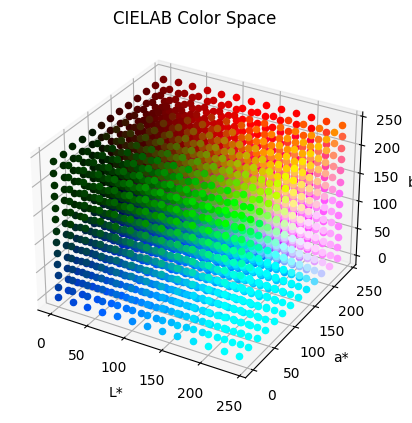

In [ ]:
L_values = np.arange(0, 255, 20)
a_values = np.arange(0, 255, 20)
b_values = np.arange(0, 255, 20)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for L in L_values:
    for a in a_values:
        for b in b_values:
            lab = np.uint8([[[L, a, b]]])
            rgb = cv2.cvtColor(lab, cv2.COLOR_Lab2RGB).squeeze() / 255.0

            ax.scatter(L, a, b, color=rgb)

ax.set_xlabel('L*')
ax.set_ylabel('a*')
ax.set_zlabel('b*')
ax.set_title('CIELAB Color Space')

plt.show()

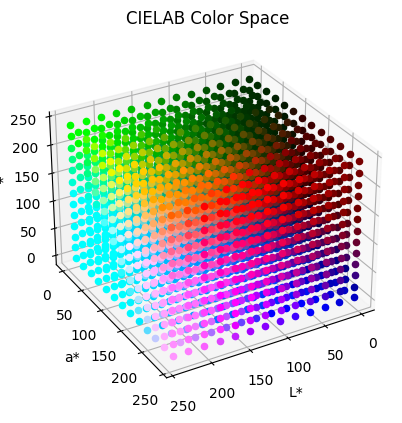

In [ ]:
L_values = np.arange(0, 255, 20)
a_values = np.arange(0, 255, 20)
b_values = np.arange(0, 255, 20)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for L in L_values:
    for a in a_values:
        for b in b_values:
            lab = np.uint8([[[L, a, b]]])
            rgb = cv2.cvtColor(lab, cv2.COLOR_Lab2RGB).squeeze() / 255.0
            ax.scatter(L, a, b, color=rgb)

ax.set_xlabel('L*')
ax.set_ylabel('a*')
ax.set_zlabel('b*')
ax.set_title('CIELAB Color Space')

ax.view_init(elev=30, azim=60)

plt.show()

In [ ]:
import os
def create_folder(directory):
    try:
        os.makedirs(directory)
        print(f"Directory '{directory}' created successfully.")
    except FileExistsError:
        print(f"Directory '{directory}' already exists.")

def empty_folder(folder):
    for filename in os.listdir(folder):
        file_path = os.path.join(folder, filename)
        try:
            if os.path.isfile(file_path) or os.path.islink(file_path):
                os.unlink(file_path)
            elif os.path.isdir(file_path):
                empty_folder(file_path)
                os.rmdir(file_path)
        except Exception as e:
            print(f"Failed to delete {file_path}. Reason: {e}")

In [ ]:
import os
import cv2
import re
from base64 import b64encode
from IPython.display import HTML

# Parameters
frames_folder = 'cielab_frames'
output_video = 'cielab_rotation.mp4'
frame_rate = 4
frame_size = (800, 600)

# Get PNG files and sort them numerically
png_files = [f for f in os.listdir(frames_folder) if f.endswith('.png')]

def extract_number(filename):
    match = re.search(r'(\d+)', filename)
    return int(match.group(1)) if match else -1

png_files.sort(key=extract_number)

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video_writer = cv2.VideoWriter(output_video, fourcc, frame_rate, frame_size)

for png_file in png_files:
    img_path = os.path.join(frames_folder, png_file)
    img = cv2.imread(img_path)

    if img is None:
        print(f"Error: Could not read image '{img_path}'")
        continue

    img = cv2.resize(img, frame_size)

    video_writer.write(img)

video_writer.release()

print(f'Video saved as {output_video}')

# Re-encode the video using ffmpeg
import subprocess

input_file = output_video
output_file = 'cielab_rotation_encoded.mp4'

# Run ffmpeg command to re-encode
ffmpeg_command = f"ffmpeg -y -i {input_file} -vcodec libx264 -crf 28 {output_file}"
subprocess.run(ffmpeg_command, shell=True, stdout=subprocess.DEVNULL, stderr=subprocess.STDOUT)

print(f"Re-encoded {input_file} to {output_file}")

with open(output_file, "rb") as video_file:
    video_base64 = b64encode(video_file.read()).decode()

video_html = f"""
<video width="640" height="480" controls>
    <source src="data:video/mp4;base64,{video_base64}" type="video/mp4">
    Your browser does not support the video tag.
</video>
"""

HTML(video_html)

Video saved as cielab_rotation.mp4
Re-encoded cielab_rotation.mp4 to cielab_rotation_encoded.mp4


LAB: [103 206  39]


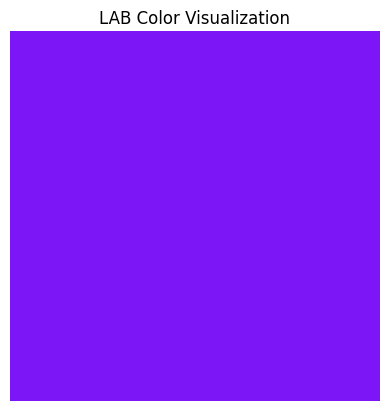

In [ ]:
rgb = np.array([[[124, 22, 245]]], dtype=np.uint8)


lab = cv2.cvtColor(rgb, cv2.COLOR_RGB2LAB)

print('LAB:', lab[0, 0])

lab_image = np.zeros((100, 100, 3), dtype=np.uint8)
lab_image[:] = lab

rgb_image = cv2.cvtColor(lab_image, cv2.COLOR_LAB2RGB)

plt.imshow(rgb_image)
plt.axis('off')
plt.title('LAB Color Visualization')
plt.show()


# CIELAB color masks


In [ ]:
!apt-get -qq install ffmpeg
from matplotlib.animation import FuncAnimation
from IPython.display import Video,HTML,display
from base64 import b64encode
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import cv2
import subprocess

In [ ]:
color_limits_cielab = {
    'black': [[0, 128, 128], [50, 128, 128]],
    'white': [[200, 128, 128], [255, 128, 128]],
    'gray': [[30, 128, 128], [230, 128, 128]],
    'red': [[0, 175, 155], [205, 255, 255]],
    'green': [[0, 0, 200], [255, 70, 255]],
    'blue': [[0, 40, 0], [110, 211 , 53]],
    'cyan': [[128, 0, 0], [220, 125, 125]],
    'orange': [[128, 150, 180], [168, 195, 255]],
    'purple': [[42, 195, 38], [140, 255, 140]],
    'pink': [[190, 150, 0], [220, 200, 120]],
    'brown': [[50, 203, 144], [64, 255, 144]],
    'yellow': [[200, 115, 200], [255, 145, 255]],
}

color_list = ['red', 'green', 'yellow', 'blue', 'cyan','purple', 'pink', 'white', 'gray','black']

In [ ]:
def create_folder(directory):
    try:
        os.makedirs(directory)
        print(f"Directory '{directory}' created successfully.")
    except FileExistsError:
        print(f"Directory '{directory}' already exists.")

def empty_folder(folder):
    for filename in os.listdir(folder):
        file_path = os.path.join(folder, filename)
        try:
            if os.path.isfile(file_path) or os.path.islink(file_path):
                os.unlink(file_path)
            elif os.path.isdir(file_path):
                empty_folder(file_path)
                os.rmdir(file_path)
        except Exception as e:
            print(f"Failed to delete {file_path}. Reason: {e}")

In [ ]:
def display_videos(original_video_path, video_type):
    video_paths = [f"/content/color_masks/{color}_filter_cielab_{video_type}_encoded.mp4" for color in color_list]
    labels = [color.capitalize() for color in color_list]
    videos_html = ""
    #original video
    video = Video(original_video_path, embed=True, width=640, height=480)
    video_html = f'<div style="text-align:center; margin-right:20px;">' \
                  f'<p style="font-size:16px; font-weight:bold; margin-bottom:5px;">{video_type}</p>' \
                  f'{video._repr_html_()}' \
                  f'</div>'
    videos_html += video_html
    #filtered videos
    for video_path, label in zip(video_paths, labels):
        video = Video(video_path, embed=True, width=640, height=480)
        video_html = f'<div style="text-align:center; margin-right:20px;">' \
                     f'<p style="font-size:16px; font-weight:bold; margin-bottom:5px;">{label}</p>' \
                     f'{video._repr_html_()}' \
                     f'</div>'
        videos_html += video_html

    html = f'<div style="display:flex; flex-direction:row; overflow-x:auto; white-space:nowrap;">' \
           f'{videos_html}' \
           f'</div>'

    display(HTML(html))

def encode_videos(directory):
    video_files = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f)) and f.endswith('.mp4')]

    for video_file in video_files:
        input_file = os.path.join(directory, video_file)
        output_file = os.path.join(directory, f"{os.path.splitext(video_file)[0]}_encoded.mp4")

        ffmpeg_command = f"ffmpeg -y -i {input_file} -vcodec libx264 -crf 28 {output_file}"
        result = subprocess.run(ffmpeg_command, shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)

        if result.returncode == 0:
            print(f"Successfully re-encoded {video_file} to {output_file}")
            os.remove(input_file)
            print(f"Deleted original file: {input_file}")
        else:
            print(f"Failed to re-encode {video_file}. Error: {result.stderr.decode('utf-8')}")

    print("Re-encoding and deletion process completed.")


def create_masked_videos(input_video_path, output_directory, video_type):
    create_folder(output_directory)
    empty_folder(output_directory)

    cap = cv2.VideoCapture(input_video_path)
    if not cap.isOpened():
        print(f"Error: Unable to open video '{input_video_path}'")
        return

    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)

    for color in color_list:
        lower_lab, upper_lab = np.array(color_limits_cielab[color][0]), np.array(color_limits_cielab[color][1])
        output_video_path = f"{output_directory}/{color}_filter_cielab_{video_type}.mp4"
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

        cap.set(cv2.CAP_PROP_POS_FRAMES, 0)

        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break

            lab_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2LAB)
            mask = cv2.inRange(lab_frame, lower_lab, upper_lab)
            filtered_frame = cv2.bitwise_and(frame, frame, mask=mask)
            out.write(filtered_frame)

        out.release()

    cap.release()

In [ ]:
output_directory = '/content/color_masks'
input_video_path = '/content/cielab_rotation_encoded.mp4'
video_type = 'Rotating_Graph'

create_masked_videos(input_video_path, output_directory,video_type)
encode_videos(output_directory)
display_videos(input_video_path,video_type)

Directory '/content/color_masks' already exists.
Successfully re-encoded pink_filter_cielab_Rotating_Graph.mp4 to /content/color_masks/pink_filter_cielab_Rotating_Graph_encoded.mp4
Deleted original file: /content/color_masks/pink_filter_cielab_Rotating_Graph.mp4
Successfully re-encoded black_filter_cielab_Rotating_Graph.mp4 to /content/color_masks/black_filter_cielab_Rotating_Graph_encoded.mp4
Deleted original file: /content/color_masks/black_filter_cielab_Rotating_Graph.mp4
Successfully re-encoded gray_filter_cielab_Rotating_Graph.mp4 to /content/color_masks/gray_filter_cielab_Rotating_Graph_encoded.mp4
Deleted original file: /content/color_masks/gray_filter_cielab_Rotating_Graph.mp4
Successfully re-encoded cyan_filter_cielab_Rotating_Graph.mp4 to /content/color_masks/cyan_filter_cielab_Rotating_Graph_encoded.mp4
Deleted original file: /content/color_masks/cyan_filter_cielab_Rotating_Graph.mp4
Successfully re-encoded blue_filter_cielab_Rotating_Graph.mp4 to /content/color_masks/blue_f

In [ ]:
output_directory = '/content/color_masks'
input_video_path = '/content/Visible_gamut_within_CIELAB_color_space_D65_whitepoint_mesh.mp4'
video_type = 'Visible_Gamut'

create_masked_videos(input_video_path, output_directory,video_type)
encode_videos(output_directory)
display_videos(input_video_path,video_type)

Directory '/content/color_masks' already exists.
Successfully re-encoded purple_filter_cielab_Visible_Gamut.mp4 to /content/color_masks/purple_filter_cielab_Visible_Gamut_encoded.mp4
Deleted original file: /content/color_masks/purple_filter_cielab_Visible_Gamut.mp4
Successfully re-encoded blue_filter_cielab_Visible_Gamut.mp4 to /content/color_masks/blue_filter_cielab_Visible_Gamut_encoded.mp4
Deleted original file: /content/color_masks/blue_filter_cielab_Visible_Gamut.mp4
Successfully re-encoded pink_filter_cielab_Visible_Gamut.mp4 to /content/color_masks/pink_filter_cielab_Visible_Gamut_encoded.mp4
Deleted original file: /content/color_masks/pink_filter_cielab_Visible_Gamut.mp4
Successfully re-encoded yellow_filter_cielab_Visible_Gamut.mp4 to /content/color_masks/yellow_filter_cielab_Visible_Gamut_encoded.mp4
Deleted original file: /content/color_masks/yellow_filter_cielab_Visible_Gamut.mp4
Successfully re-encoded white_filter_cielab_Visible_Gamut.mp4 to /content/color_masks/white_fil

In [ ]:
output_directory = '/content/color_masks'
input_video_path = '/content/SRGB_gamut_within_CIELAB_color_space_mesh.mp4'
video_type = 'SRGB_Gamut'

create_masked_videos(input_video_path, output_directory,video_type)
encode_videos(output_directory)
display_videos(input_video_path,video_type)

Directory '/content/color_masks' already exists.
Successfully re-encoded white_filter_cielab_SRGB_Gamut.mp4 to /content/color_masks/white_filter_cielab_SRGB_Gamut_encoded.mp4
Deleted original file: /content/color_masks/white_filter_cielab_SRGB_Gamut.mp4
Successfully re-encoded gray_filter_cielab_SRGB_Gamut.mp4 to /content/color_masks/gray_filter_cielab_SRGB_Gamut_encoded.mp4
Deleted original file: /content/color_masks/gray_filter_cielab_SRGB_Gamut.mp4
Successfully re-encoded yellow_filter_cielab_SRGB_Gamut.mp4 to /content/color_masks/yellow_filter_cielab_SRGB_Gamut_encoded.mp4
Deleted original file: /content/color_masks/yellow_filter_cielab_SRGB_Gamut.mp4
Successfully re-encoded red_filter_cielab_SRGB_Gamut.mp4 to /content/color_masks/red_filter_cielab_SRGB_Gamut_encoded.mp4
Deleted original file: /content/color_masks/red_filter_cielab_SRGB_Gamut.mp4
Successfully re-encoded black_filter_cielab_SRGB_Gamut.mp4 to /content/color_masks/black_filter_cielab_SRGB_Gamut_encoded.mp4
Deleted ori

In [ ]:
def create_masked_image(input_image_path):
    original_image = cv2.imread(input_image_path)
    lab_image = cv2.cvtColor(original_image, cv2.COLOR_RGB2LAB)

    images = [original_image]
    titles = ['Original']

    for color, (lower, upper) in color_limits_cielab.items():
        lower_bound = np.array(lower, dtype=np.uint8)
        upper_bound = np.array(upper, dtype=np.uint8)

        # Create a mask for the current color
        mask = cv2.inRange(lab_image, lower_bound, upper_bound)
        masked_image = cv2.bitwise_and(original_image, original_image, mask=mask)

        images.append(masked_image)
        titles.append(color.capitalize())

    fig, axes = plt.subplots(1, len(images), figsize=(20, 10))
    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img)
        ax.set_title(title)
        ax.axis('off')

    plt.tight_layout()
    plt.show()


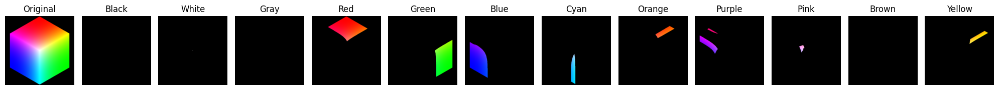

In [ ]:
create_masked_image('/content/CIE_RGB_color_cube.png')

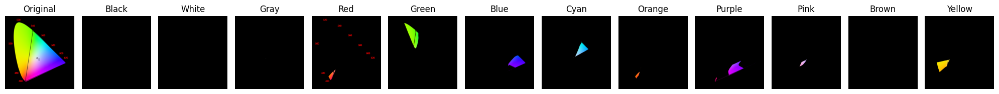

In [ ]:
create_masked_image('/content/CIE1931xy_CIERGB.svg.png')